In [1]:
!pip install --user scikit-misc

In [2]:
# https://github.com/scverse/scanpy-tutorials/blob/master/pbmc3k.ipynb
# https://github.com/theislab/scanpy-tutorials

In [3]:
# !mkdir data
# !wget http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz -O data/pbmc3k_filtered_gene_bc_matrices.tar.gz
# !cd data; tar -xzf pbmc3k_filtered_gene_bc_matrices.tar.gz
# !mkdir write

In [4]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)

In [5]:
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import numpy as np

In [6]:
sc.settings.set_figure_params(scanpy=True, dpi=150, dpi_save=150, color_map='viridis_r',facecolor='white',
                             format='png', transparent=False, frameon=False, vector_friendly=True, fontsize=14)
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.3 scipy==1.7.1 pandas==1.3.4 scikit-learn==0.24.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.6


In [7]:
results_file = 'write/pbmc3k.h5ad'  # the file that will store the analysis results

In [8]:
adata = sc.read_10x_mtx(
    'data/filtered_gene_bc_matrices/hg19/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading

... reading from cache file cache\data-filtered_gene_bc_matrices-hg19-matrix.h5ad


In [9]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [10]:
adata

AnnData object with n_obs × n_vars = 2700 × 32738
    var: 'gene_ids'

normalizing counts per cell
    finished (0:00:00)


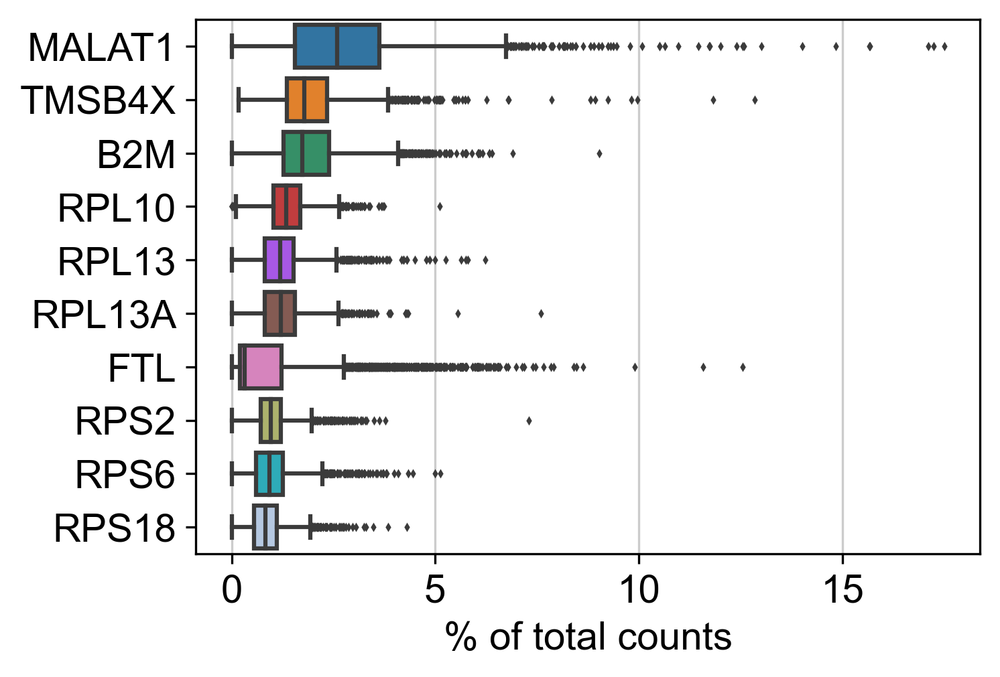

In [11]:
# Preprocessing. Show those genes that yield the highest fraction of counts in each single cell, across all cells.
with plt.rc_context():  # Use this to set figure params like size and dpi
    sc.pl.highest_expr_genes(adata, n_top=10, show=False)
    plt.savefig("figures/01.Highest_fraction_counts.png", bbox_inches="tight")

In [12]:
# Basic filtering:
sc.pp.filter_cells(adata, min_genes = 200)
sc.pp.filter_genes(adata, min_cells = 3)

filtered out 19024 genes that are detected in less than 3 cells


In [13]:
# With pp.calculate_qc_metrics, we can compute many metrics very efficiently.
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

""" Violin plot of some of the computed quality measures.
    1. Number of genes expressed in the count matrix
    2. Total counts per cell
    3. Percentage of counts in mitochondrial genes (High proportions are indicative of poor-quality cells) """

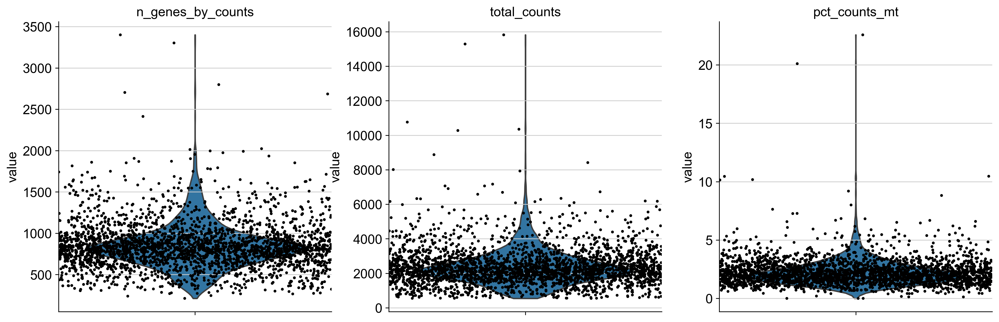

In [14]:
with plt.rc_context():  # Use this to set figure params like size and dpi
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
                 size=3, jitter=0.5, multi_panel=True, show=False)
    plt.savefig("figures/02.QC.png", bbox_inches="tight")

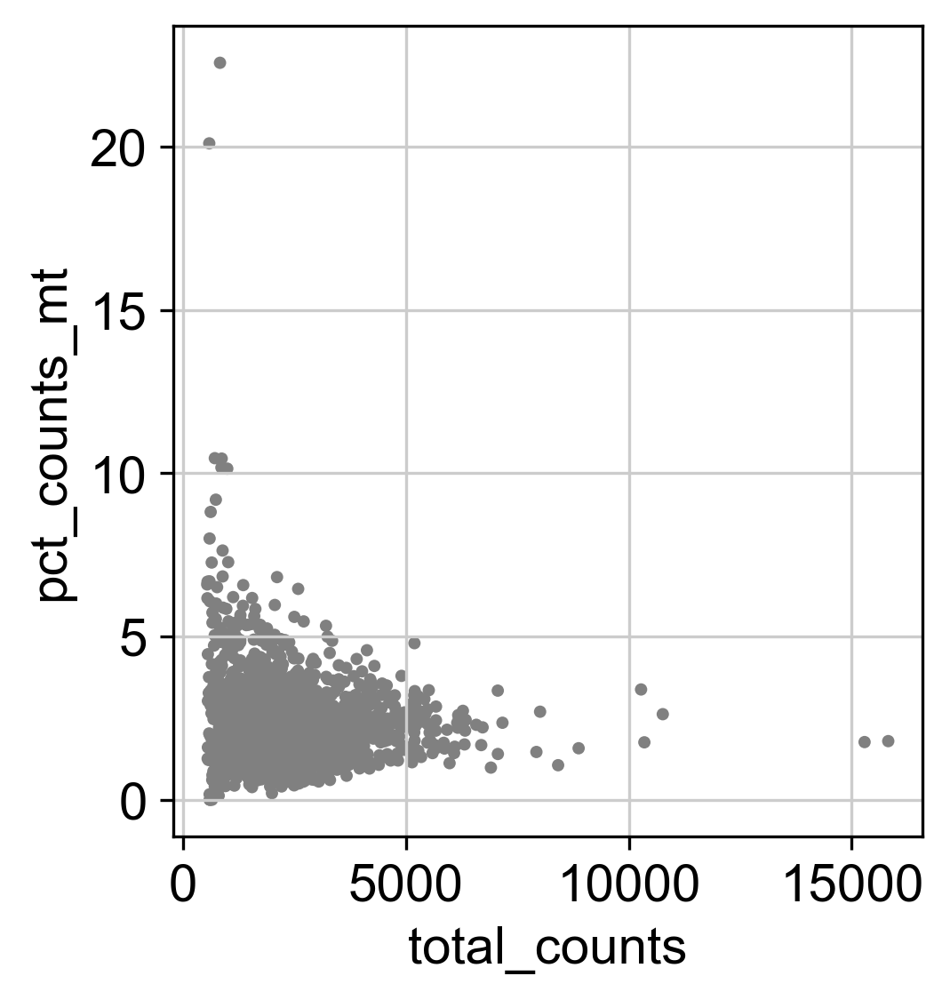

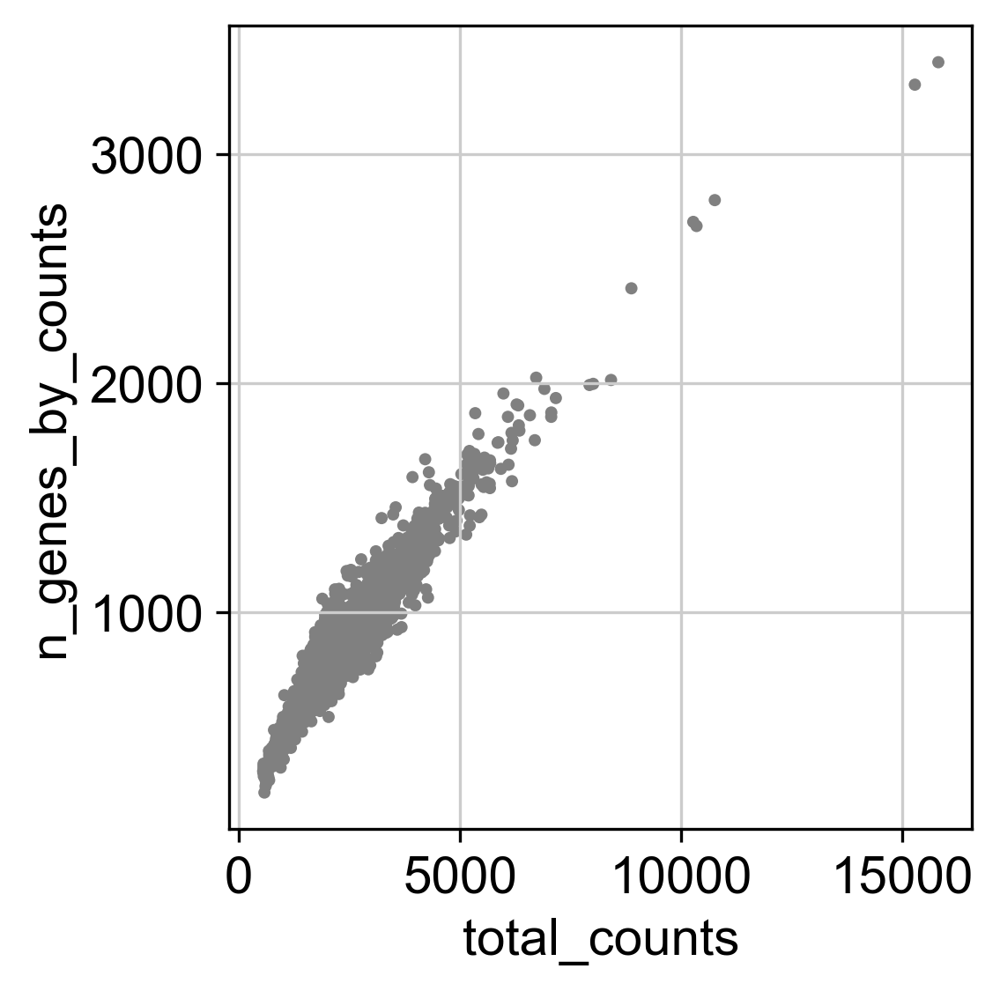

In [15]:
# Remove cells that have too many mitochondrial genes expressed or too many total counts:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [16]:
#  filtering by slicing the AnnData object.
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [17]:
"""Total-count normalize (library-size correct) the data matrix "X"to 10,000 reads per cell,
so that counts become comparable among cells."""
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


C:\Users\alber\anaconda3\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [18]:
sc.pp.log1p(adata)   # Logarithmize the data.
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)   # Identify highly-variable genes.

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


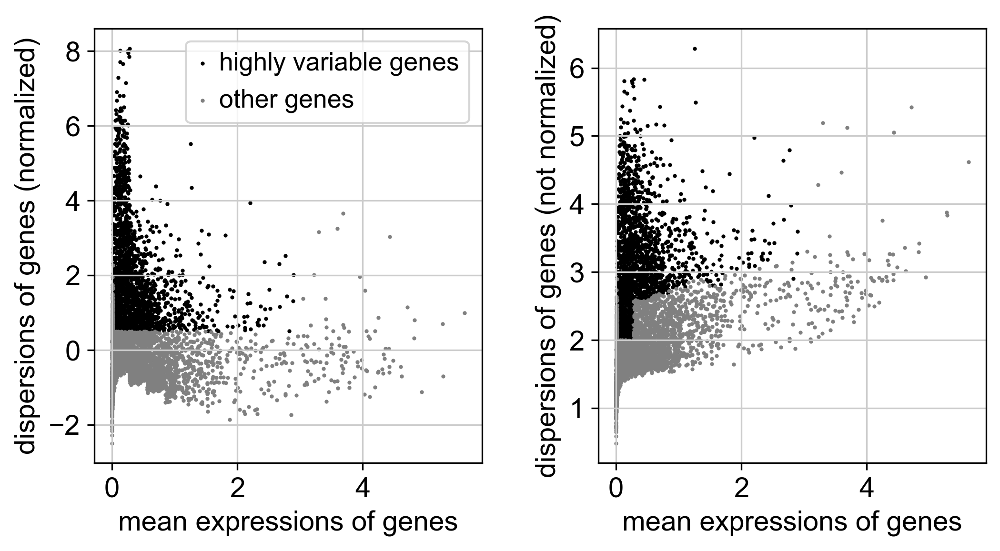

In [19]:
with plt.rc_context():  # Use this to set figure params like size and dpi
    sc.pl.highly_variable_genes(adata, highly_variable_genes=True, log=False, show=False)
    plt.savefig("figures/03.highly_variable_genes.png", bbox_inches="tight")

In [20]:
"""Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use
in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object."""
# Note. You can get back an `AnnData` of the object in `.raw` by calling `.raw.to_adata()`.
adata.raw = adata

""" If you don't proceed below with correcting the data with `sc.pp.regress_out` and scaling it via `sc.pp.scale`,
you can also get away without using `.raw` at all. The result of the previous highly-variable-genes detection is
stored as an annotation in `.var.highly_variable` and auto-detected by PCA and hence, `sc.pp.neighbors` 
and subsequent manifold/graph tools. In that case, the step *actually do the filtering* below is unnecessary, too."""

In [21]:
adata = adata[:, adata.var.highly_variable]   # Actually do the filtering

In [22]:
#  Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)   # Scale each gene to unit variance. Clip values exceeding standard deviation 10. 

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:13)


""" Principal Component Analysis. Reduce the dimensionality of the data by running principal component analysis (PCA),
which reveals the main axes of variation and denoises the data."""

In [23]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


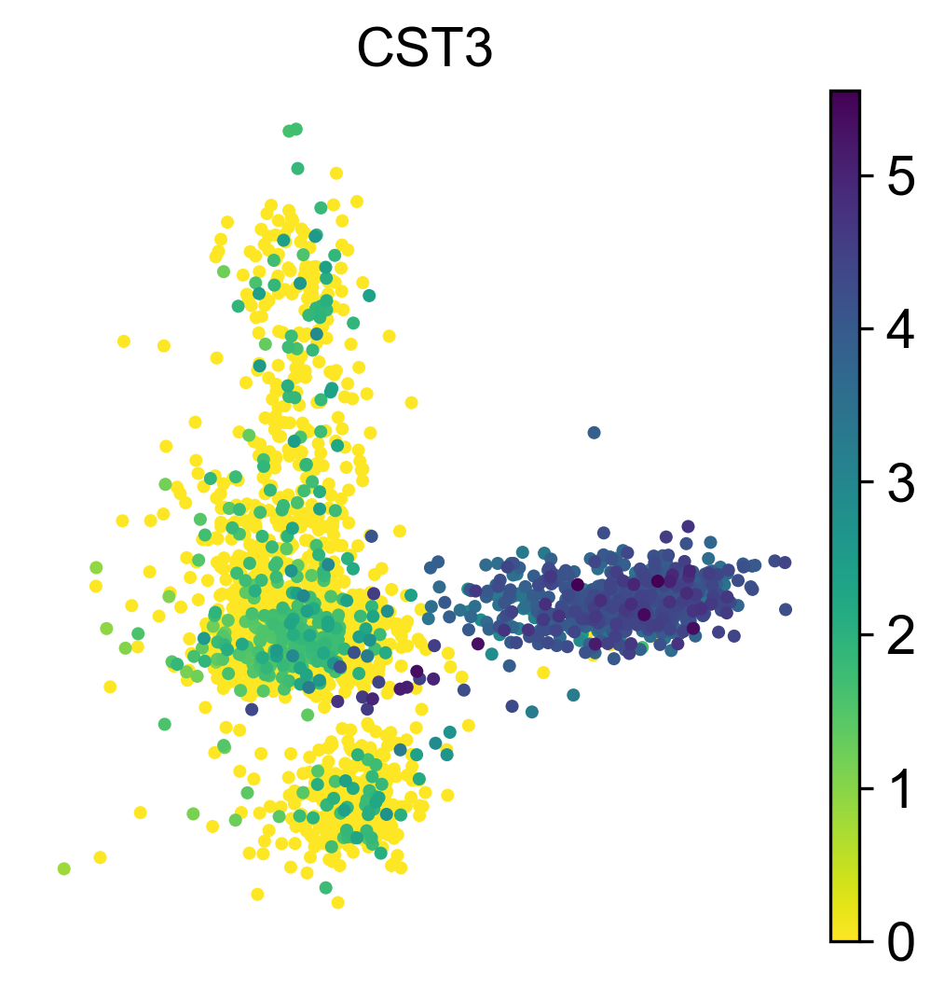

In [24]:
sc.pl.pca(adata, color='CST3', save='PCA.pdf') #  Plot in the PCA coordinates
#sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

"""Let us inspect the contribution of single PCs to the total variance in the data.
This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells,
e.g. used in the clustering function `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often a rough estimate
of the number of PCs does fine."""

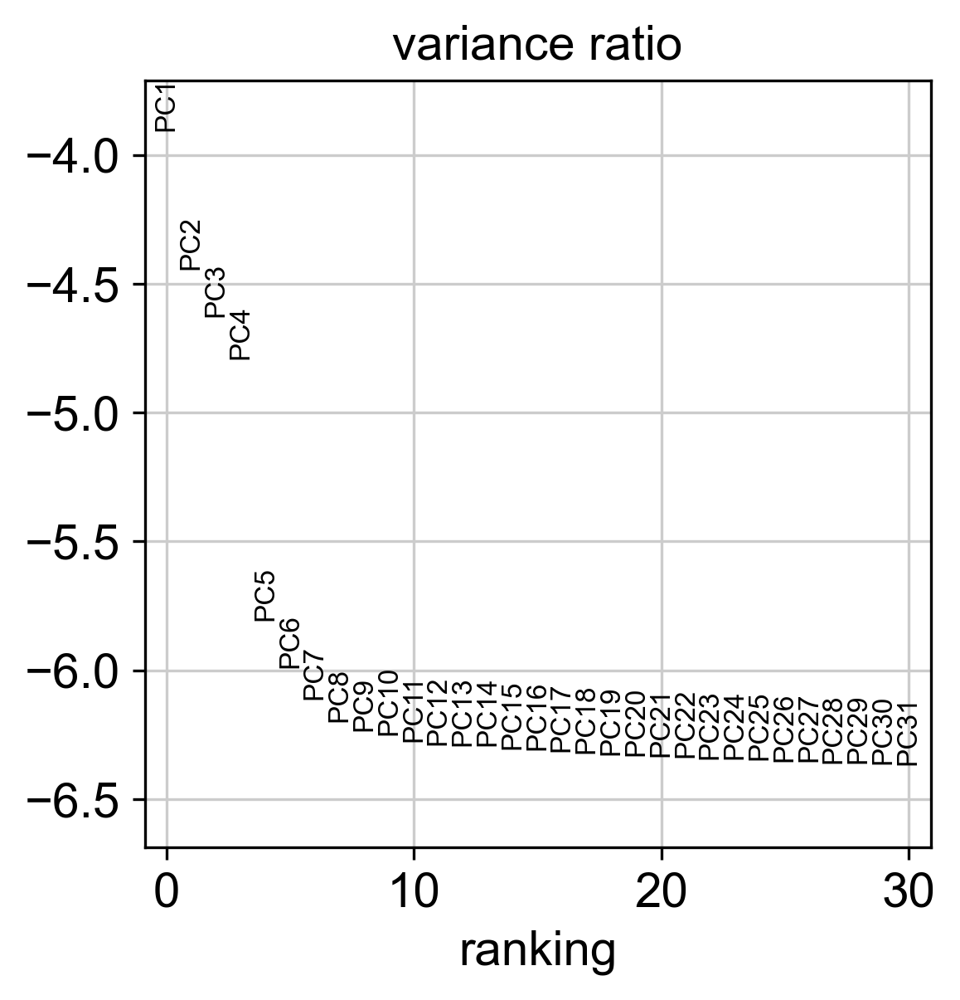

In [25]:
sc.pl.pca_variance_ratio(adata, log=True)

In [26]:
adata.write(results_file)   # Save the result.

In [27]:
adata

AnnData object with n_obs × n_vars = 2638 × 1838
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [28]:
# Computing the neighborhood graph. Compute the neighborhood graph of cells using the PCA representation of the data matrix.
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [29]:
# Embedding the neighborhood graph

In [30]:
# In some ocassions, you might still observe disconnected clusters and similar connectivity violations.
# They can usually be remedied by running:

#tl.paga(adata, groups='total_counts')
#pl.paga(adata, plot=False)           # remove `plot=False` if you want to see the coarse-grained graph
#tl.umap(adata, init_pos='paga')

In [31]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


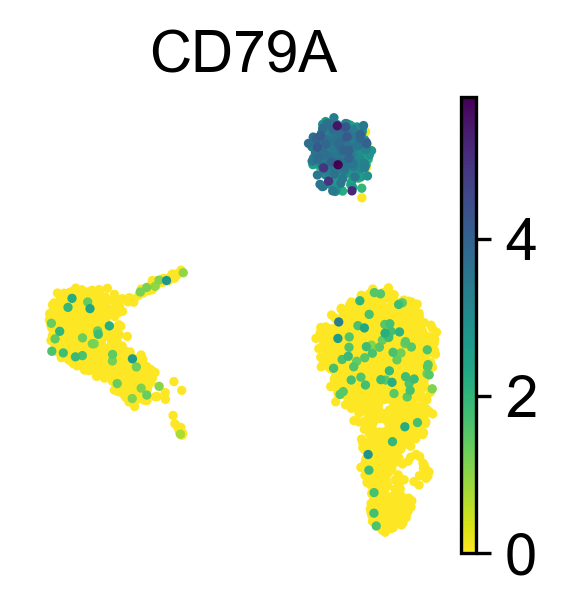

In [32]:
# rc_context is used for the figure size, in this case 4x4
with rc_context({'figure.figsize': (2, 2)}):
    sc.pl.umap(adata, color='CD79A', s=20)

[<AxesSubplot:title={'center':'CST3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'NKG7'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'PPBP'}, xlabel='UMAP1', ylabel='UMAP2'>]

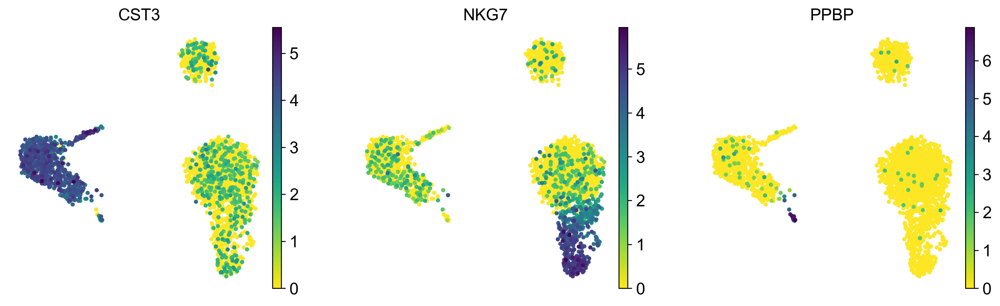

In [33]:
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'], ncols=4, s=50, legend_fontsize=50, use_raw=True, show=False)

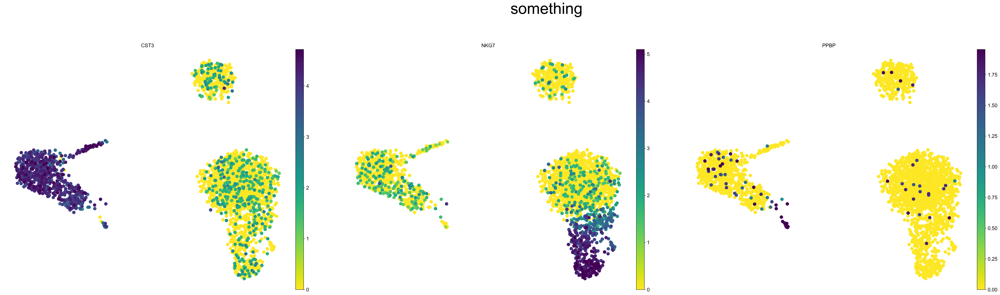

In [34]:
# "raw" (normalized, logarithmized, but uncorrected) gene expression (use_raw=True).
with rc_context({'figure.figsize': (15, 12), "font.size":36}):
    sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'], s=350, use_raw=True, show=False, vmax='p99')
    plt.suptitle("something", y=1.05)

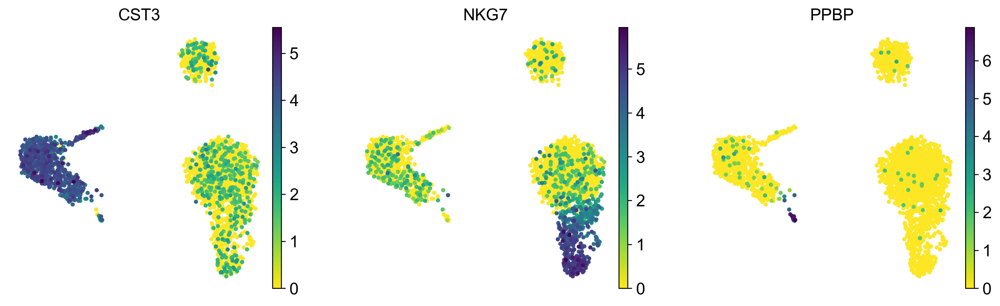

In [35]:
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'], s=50, use_raw=True)

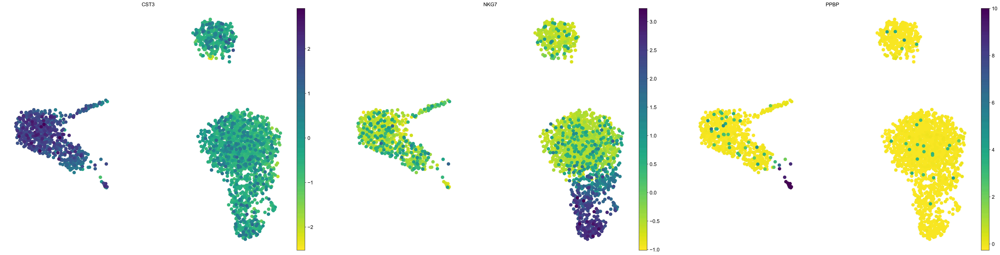

In [36]:
# Normalized, logarithmized, scaled and corrected gene expression (use_raw=False)
with rc_context({'figure.figsize': (15, 12)}):
    sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'], s=350, use_raw=False)

## Clustering the neighborhood graph

In [37]:
sc.tl.leiden(adata) # Clustering the neighborhood graph

running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


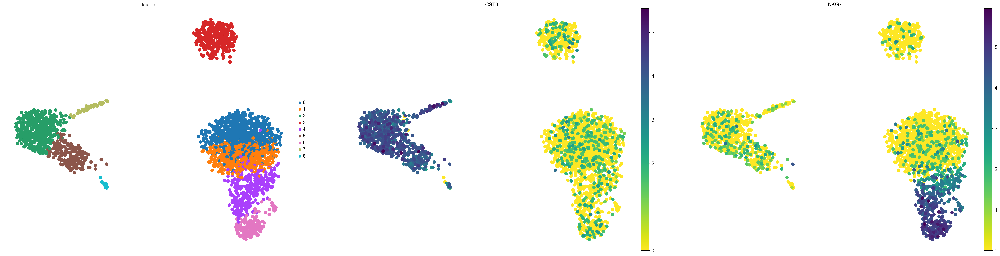

In [38]:
with rc_context({'figure.figsize': (15, 12)}):
    sc.pl.umap(adata, color=['leiden', 'CST3', 'NKG7'], s=350)

In [39]:
adata.write(results_file)   # Save the result.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


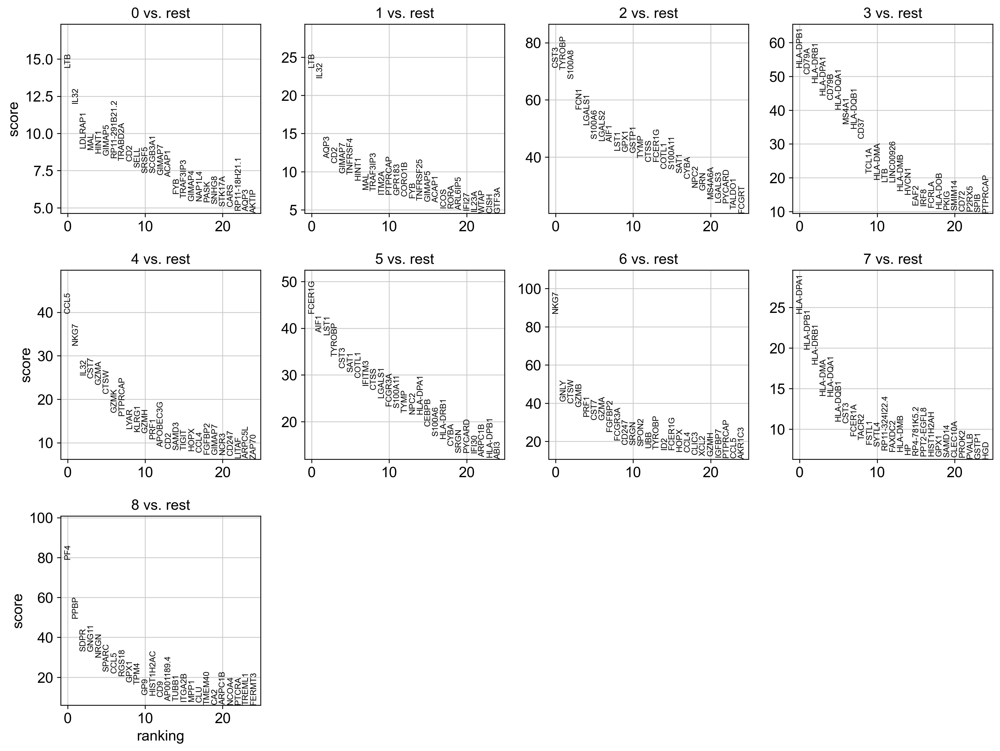

In [40]:
# Finding marker genes. Let us compute a ranking for the highly differential genes in each cluster.
# For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before.
# The simplest and fastest method to do so is the t-test.
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test', use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [41]:
sc.get.rank_genes_groups_df(adata, group="7")

,names,scores,logfoldchanges,pvals,pvals_adj
0,HLA-DPA1,24.238602,NaN,1.344636e-27,1.453789e-25
1,HLA-DPB1,19.838789,NaN,2.029660e-22,1.243505e-20
2,HLA-DRB1,17.970646,NaN,4.856302e-21,2.475075e-19
3,HLA-DMA,14.126696,NaN,1.141455e-16,3.746419e-15
4,HLA-DQA1,14.039513,NaN,3.244732e-16,1.010816e-14
...,...,...,...,...,...
1833,ARL16,-15.170816,NaN,6.929995e-48,6.368666e-45
1834,DCAF8,-15.559669,NaN,4.447105e-41,2.724593e-38
1835,TNFRSF25,-16.623873,NaN,5.028134e-49,9.241710e-46
1836,CDA,-16.937418,NaN,5.785550e-22,3.430271e-20


[<AxesSubplot:title={'center':'LTB'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'CST3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'HLA-DPB1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'CCL5'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'NKG7'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'FCER1G'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'HLA-DPA1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'CST3'}, xlabel='UMAP1', ylabel='UMAP2'>]

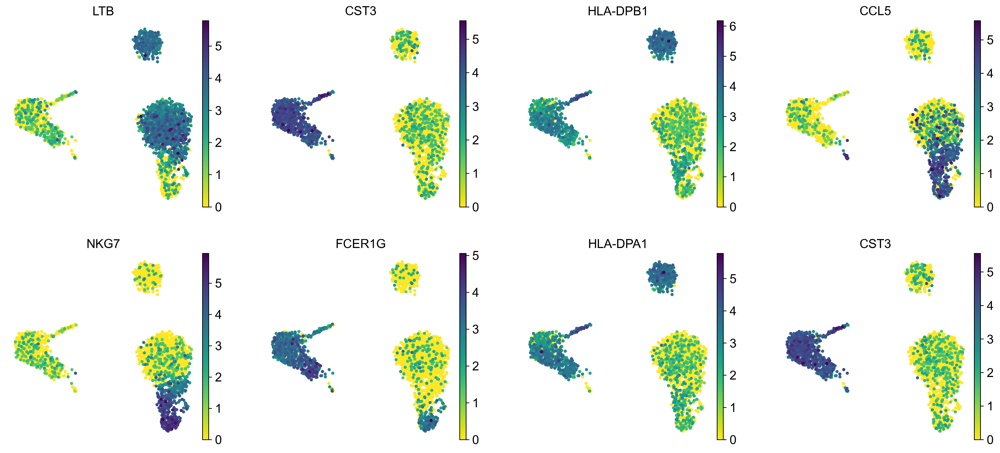

In [65]:
sc.pl.umap(adata, color=['LTB','CST3','HLA-DPB1','CCL5','NKG7','FCER1G',
                         'HLA-DPA1','CST3'
                        ], ncols=4, s=50, legend_fontsize=50, use_raw=True, show=False)

In [43]:
# https://discourse.scverse.org/t/how-do-i-get-a-list-not-plot-figure-pdf-of-highest-expressed-genes-in-scanpy/565/3

In [44]:
sc.settings.verbosity = 2  # reduce the verbosity

ranking genes
    finished (0:00:04)


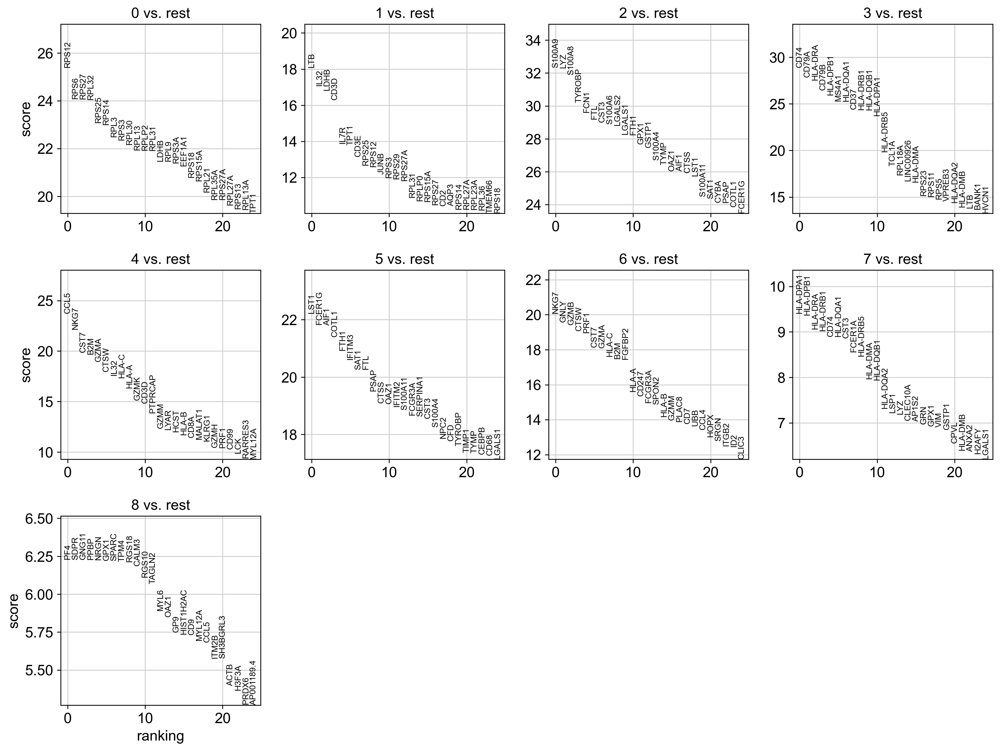

In [45]:
# Wilcoxon rank-sum (Mann-Whitney-U test). You might also consider much more powerful differential
# testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

Save the result.

In [46]:
adata.write(results_file)   # Save the result.

ranking genes
    finished (0:00:10)


C:\Users\alber\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


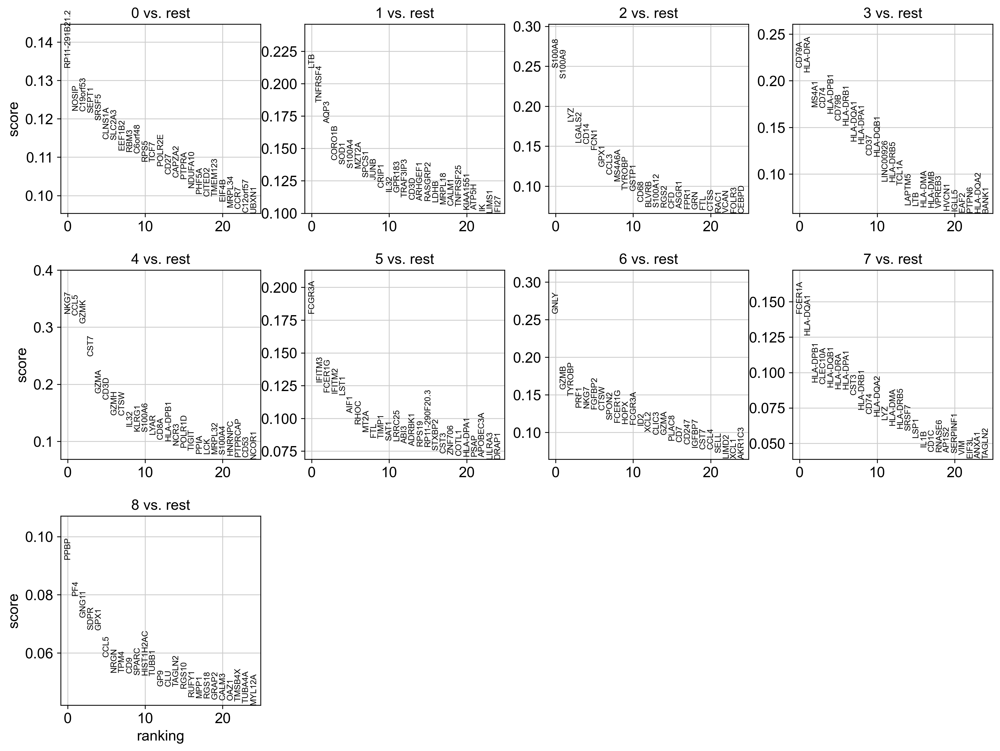

In [47]:
# As an alternative, let us rank genes using logistic regression.
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [48]:
# With the exceptions of IL7R, which is only found by the t-test and FCER1A,
# which is only found by the other two appraoches, all marker genes are recovered in all approaches.

With the exceptions of *IL7R*, which is only found by the t-test and *FCER1A*, which is only found by the other two appraoches, all marker genes are recovered in all approaches.

Louvain Group | Markers | Cell Type
---|---|---
0 | IL7R | CD4 T cells
1 | CD14, LYZ | CD14+ Monocytes
2 | MS4A1 |	B cells
3 | CD8A |	CD8 T cells
4 | GNLY, NKG7 | 	NK cells
5 | FCGR3A, MS4A7 |	FCGR3A+ Monocytes
6 | FCER1A, CST3 |	Dendritic Cells
7 | PPBP |	Megakaryocytes

In [49]:
# define a list of marker genes for later reference.
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',  
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PPBP']

Reload the object that has been save with the Wilcoxon Rank-Sum test result.

In [50]:
adata = sc.read(results_file)  # Reload the object saved with the Wilcoxon Rank-Sum test result.

In [51]:
# Show the 10 top ranked genes per cluster 0, 1, ..., 7 in a dataframe.
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)  #

,0,1,2,3,4,5,6,7,8
0,RPS12,LTB,S100A9,CD74,CCL5,LST1,NKG7,HLA-DPA1,PF4
1,RPS6,IL32,LYZ,CD79A,NKG7,FCER1G,GNLY,HLA-DPB1,SDPR
2,RPS27,LDHB,S100A8,HLA-DRA,CST7,AIF1,GZMB,HLA-DRA,GNG11
3,RPL32,CD3D,TYROBP,CD79B,B2M,COTL1,CTSW,HLA-DRB1,PPBP
4,RPS25,IL7R,FCN1,HLA-DPB1,GZMA,FTH1,PRF1,CD74,NRGN


In [52]:
result = adata.uns['rank_genes_groups']   # Get a table with the scores and groups.
#result

In [53]:
groups = result['names'].dtype.names
groups

('0', '1', '2', '3', '4', '5', '6', '7', '8')

In [54]:
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges','pvals']}).head(5)

,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,5_p,6_n,6_l,6_p,7_n,7_l,7_p,8_n,8_l,8_p
0,RPS12,0.906288,3.967674e-142,LTB,2.188508,4.886285e-73,S100A9,7.364153,3.171645e-229,CD74,...,2.652361e-109,NKG7,6.841021,1.547655e-89,HLA-DPA1,4.278315,5.422417e-21,PF4,12.905741,4.722886e-10
1,RPS6,0.791565,4.691237e-128,IL32,2.256764,2.059105e-65,LYZ,6.174874,7.959191e-229,CD79A,...,1.474923e-105,GNLY,7.888775,2.663269e-85,HLA-DPB1,4.434846,7.591860e-21,SDPR,11.863666,4.733899e-10
2,RPS27,0.902377,6.247264e-128,LDHB,1.734768,1.968730e-63,S100A8,7.471075,4.114564e-223,HLA-DRA,...,2.396419e-105,GZMB,7.663548,5.388204e-84,HLA-DRA,4.608550,1.306768e-19,GNG11,12.428451,4.733899e-10
3,RPL32,0.712480,1.091190e-127,CD3D,2.102323,1.250230e-59,TYROBP,5.352318,2.428576e-200,CD79B,...,1.456508e-101,CTSW,4.819529,4.218124e-81,HLA-DRB1,4.237393,1.865104e-19,PPBP,13.035219,4.744938e-10
4,RPS25,0.982579,8.313330e-118,IL7R,1.950868,8.146664e-44,FCN1,5.469655,2.149804e-192,HLA-DPB1,...,3.401277e-97,PRF1,6.341527,3.301557e-80,CD74,3.639149,5.853161e-19,NRGN,9.092909,4.800511e-10


ranking genes
    finished (0:00:01)


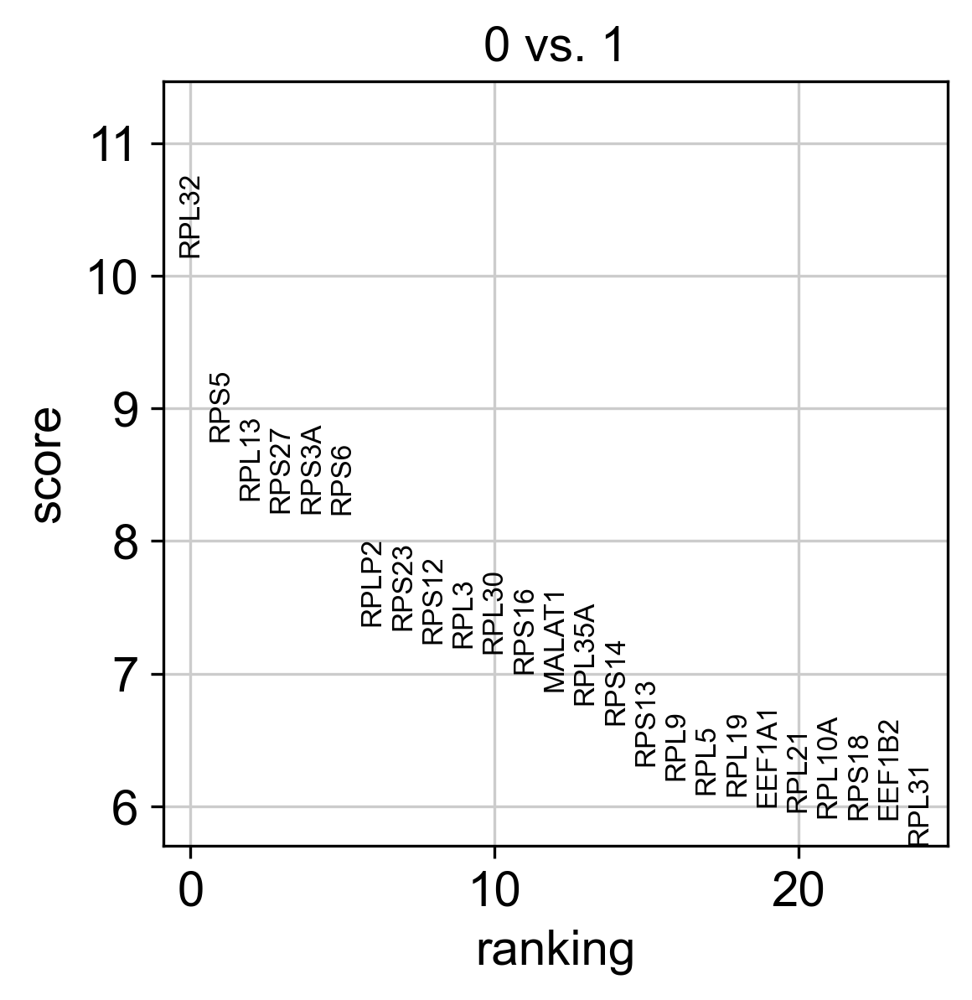

In [55]:
# Compare to a single cluster: 
adata.uns['log1p']["base"] = None
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=25)

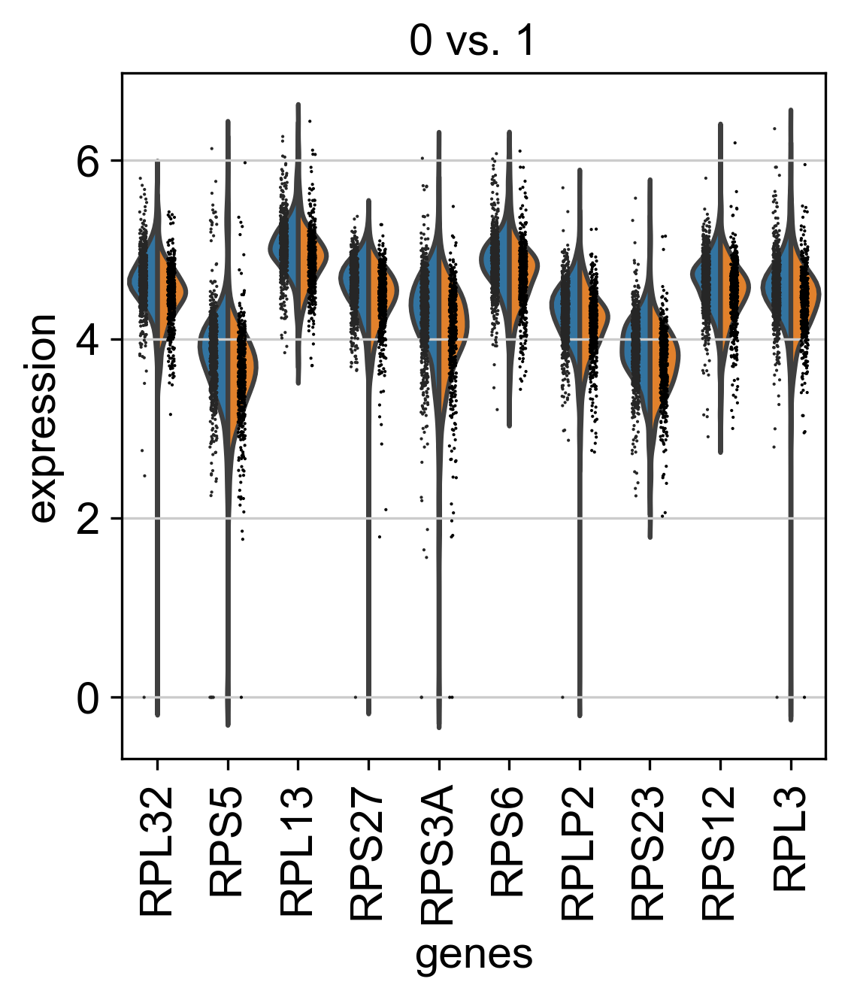

In [56]:
# More detailed view for a certain group, use sc.pl.rank_genes_groups_violin.
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=10)

ranking genes
    finished (0:00:01)


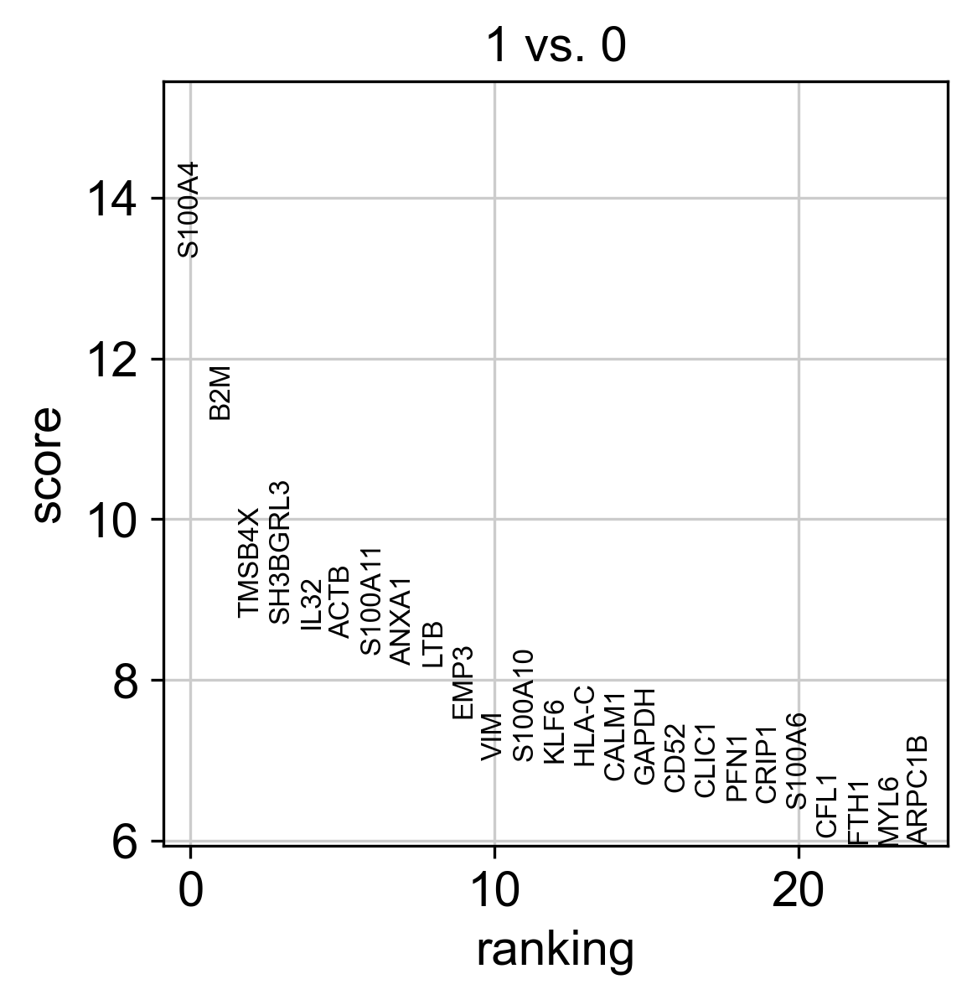

In [57]:
# Compare to a single cluster: 
adata.uns['log1p']["base"] = None
sc.tl.rank_genes_groups(adata, 'leiden', groups=['1'], reference='0', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['1'], n_genes=25)

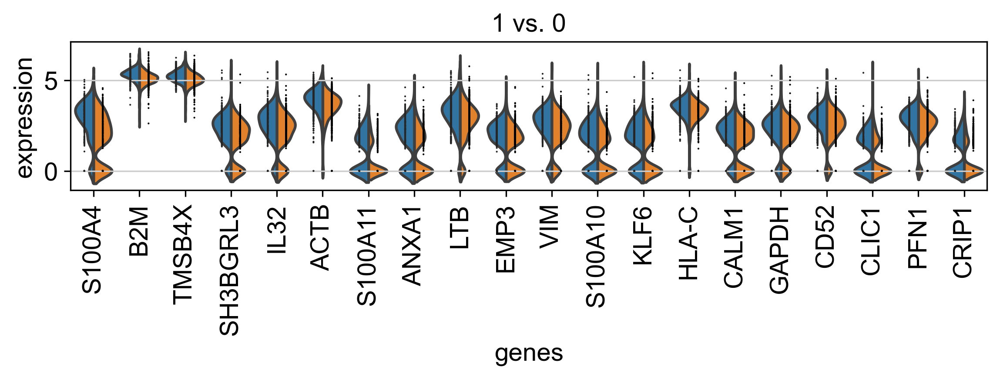

In [58]:
with rc_context({'figure.figsize': (9, 1.5)}):
    sc.pl.rank_genes_groups_violin(adata, n_genes=20, jitter=False)

In [59]:
# Reload object with computed differential expression (i.e. DE via comparison with the rest of the groups):
adata = sc.read(results_file)

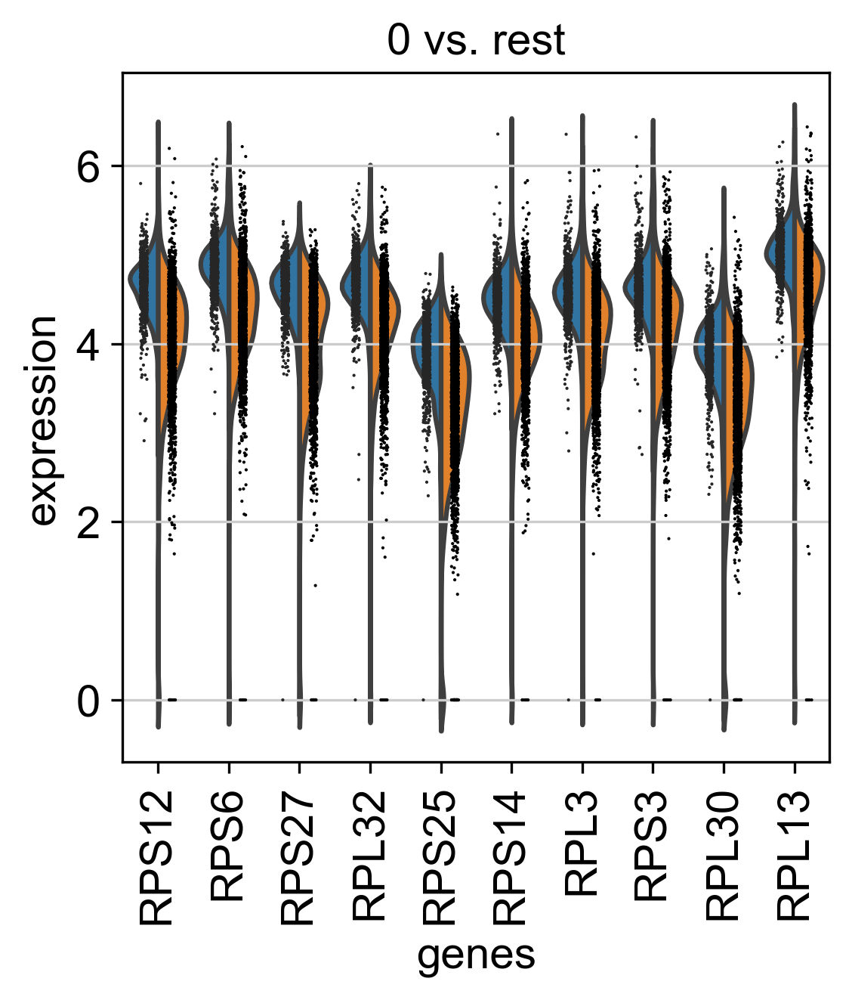

In [60]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=10)

If you want to compare a certain gene across groups, use the following.

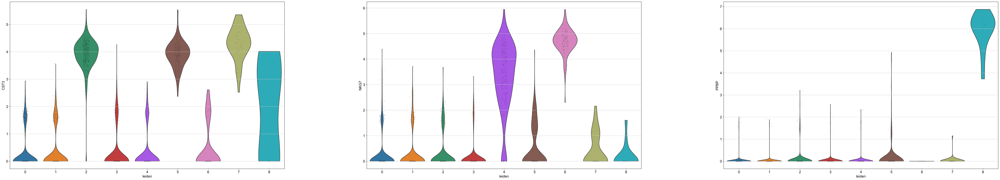

In [61]:
with rc_context({'figure.figsize': (15, 12)}):
    sc.pl.violin(adata, ['CST3', 'NKG7', 'PPBP'], groupby='leiden')

Actually mark the cell types.

In [62]:
new_cluster_names = [
    'CD4 T', 'CD14 Monocytes',
    'B cells', 'CD8 T', 
    'NK', 'FCGR3A Monocytes',
    'Dendritic', 'Megakaryocytes']

In [63]:
adata.rename_categories('leiden', new_cluster_names)

ValueError: new categories need to have the same number of items as the old categories!

In [ ]:
plt.rcParams["figure.figsize"] = (15,10)
sc.pl.umap(adata, s=150, color='leiden', legend_loc='on data', title='', frameon=False,
           legend_fontsize=25, legend_fontoutline=20)

In [ ]:
with rc_context({'figure.figsize': (15, 10)}):
    sc.pl.umap(adata, color='leiden', s=150, add_outline=True, legend_loc='on data', legend_fontsize=20,
               legend_fontoutline=2, frameon=False, title='Clustering of cells', palette='Set1')

In [ ]:
genes=['CD79A', 'MS4A1', 'IGJ', 'CD3D', 'FCER1A', 'FCGR3A', 'leiden']
with rc_context({'figure.figsize': (3, 3)}):
    sc.pl.umap(adata, color=genes, s=50, frameon=False, ncols=3)

In [ ]:
#sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')

Now that we annotated the cell types, let us visualize the marker genes.

In [ ]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden')

In [ ]:
dp = sc.pl.dotplot(adata, marker_genes, 'leiden', return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=1).show()

In [ ]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden', dendrogram=True, figsize=(8,5))

There is also a very compact violin plot.

In [ ]:
sc.pl.heatmap(adata, marker_genes, groupby='leiden', swap_axes=True, dendrogram=True)

In [ ]:
sc.pl.heatmap(adata, marker_genes, groupby='leiden', swap_axes=True, dendrogram=True,cmap='bwr',show=False,
             figsize=(15,7), var_group_rotation=0) #save='ClusterMap.png'

In [ ]:
sc.pl.heatmap(adata, marker_genes, groupby='leiden', swap_axes=True, dendrogram=True,cmap='bwr',show=True)

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=3, use_raw=False, vmin=-3, vmax=3, cmap='bwr', layer='scaled')

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=30, values_to_plot='logfoldchanges', min_logfoldchange=4, vmax=7, vmin=-7, cmap='bwr', groups=['1', '5'])

In [ ]:
ax = sc.pl.correlation_matrix(adata, 'leiden', figsize=(5,3.5))

In [ ]:
#help(sc.pl.heatmap)

In [ ]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90)

During the course of this analysis, the AnnData accumlated the following annotations.

In [ ]:
adata

In [ ]:
adata.write(results_file, compression='gzip')  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading

Get a rough overview of the file using `h5ls`, which has many options - for more details see [here](https://github.com/theislab/scanpy_usage/blob/master/170505_seurat/info_h5ad.md). The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations in `adata.raw`.

In [ ]:
adata.raw.to_adata().write('./write/pbmc3k_withoutX.h5ad')

If you want to export to "csv", you have the following options:

In [ ]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv('./write/pbmc3k_corrected_louvain_groups.csv')

In [ ]:
# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv('./write/pbmc3k_corrected_X_pca.csv')

In [ ]:
# Export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )